# PHYS 481 Assignment 2: Images and Filters

### Hayden Church

## Introduction

In this assignment we are using numpy arrays and matplot lib to process and display images. We will be exploring ways of optimizing different functions and learning methods for manipulating image data in order to make certain things more obvious. We will be blurring, sharpening, and implemneting edge detection.


### Question 1

Load the file 'mandrill.png' using matplotlib and perform some basic manipulations on it. For each of these, display the original and the altered image side-by-side with no rescaling of the pixel size. You can use the helper function in the template. 

a. Create a 10-pixel wide vertical black line through the middle of the image by replacing data values in the image with zeroes. Display the original and the altered image side-by-side.

b. Transpose the original image. Display the original and the altered image side-by-side.
    
c. "Posterize" the original image by reducing the number of different color levels in each channel from 256 to 2. In other words, reduce the precision in the data values in each color channel (R,G,B) so they assume only the value 0 or 1, and no values in between. Display the original and the altered image side-by-side.

d. Comment on the images. This can be extremely brief for this question.



In [1]:
# Load standard libraries for numerical methods and plotting.
# This same block will start almost every assignment in PHYS 481.
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

# Helper function for this assignment
def display_img(img1,img2=None):
    """
    Display 1 or 2 RGBA images in matplotlib format side-by-side inline in Jupyter.
    For 1 image, call with only one parameter.
    Disable any resizing of the images; show them at the exact resolution of the image without rescaling the pixel size.
    """
    dpi = matplotlib.rcParams['figure.dpi']  # dots per inch of the device
    height = img1.shape[0]
    width = img1.shape[1]
    if img2 is None:   # Only one figure provided
        figsize = width / float(dpi), height / float(dpi)
        plt.figure(figsize=figsize)
        plt.imshow(img1)
    else:                # 2 Figures provided
        height=np.max([height,img2.shape[0]])
        width=width+img2.shape[1]
        figsize = width / float(dpi), height / float(dpi)
        f, ax=plt.subplots(1,2,figsize=figsize)
        ax[0].imshow(img1)
        ax[1].imshow(img2)


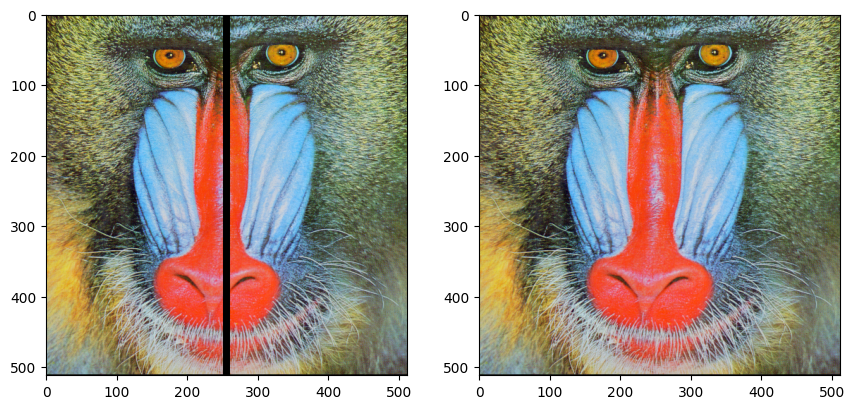

In [2]:
def q1a():
    """
    Reads in mandrill.png and changes RGB values so the image will display a black line down the center
    """
    # read in image and create a copy for side by side
    img = plt.imread('mandrill.png')
    img2 = img.copy()
    
    for row in img:
        for i in range(512):
            if (i in range(251,261)):
                #set the colours in the range to 0 to create black
                row[i][0] = 0
                row[i][1] = 0
                row[i][2] = 0

    display_img(img, img2)

    
q1a()

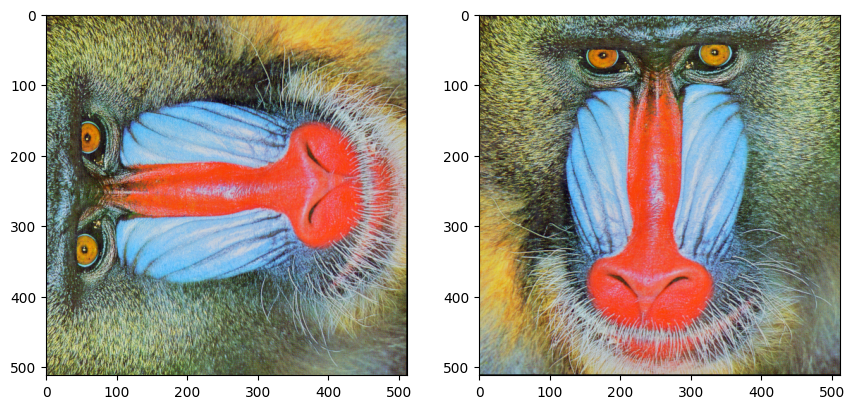

In [3]:
def q1b():
    """
    Loads in mandrill.png and transposes the image
    """
    # read in image and create copy for side by side
    img2 = plt.imread('mandrill.png')
    img = img2.copy()

    # transpose image
    for i in range(512):
        for j in range(512):
            img[i][j] = img2[j][i]
    
    display_img(img, img2)

    

    
q1b()

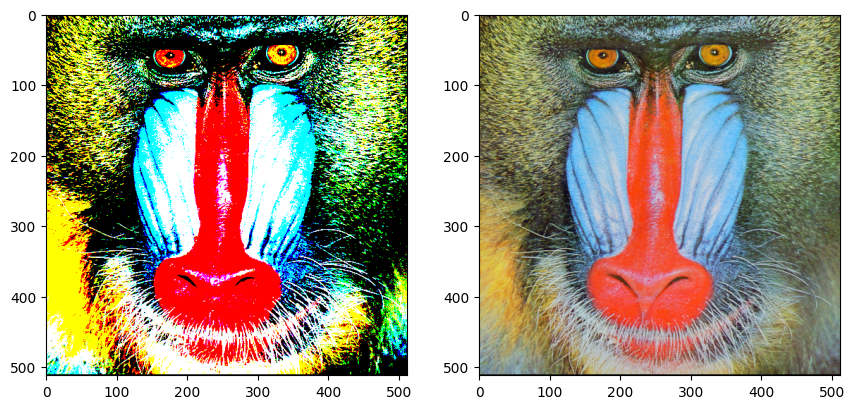

In [4]:
def q1c():
    """
    Loads in mandrill.png and posterizes the image
    """
    img = plt.imread('mandrill.png')
    img2 = img.copy()
    
    for row in img:
        for col in row:
            # loop through the first 3 items in each pixel tuple (R,G,B,A)
            for j in range(3):
                if col[j] > 0.5:
                    col[j] = 1
                elif col[j] < 0.5:
                    col[j] = 0

    display_img(img, img2)
    
    
q1c()

Question 1a shows a black line through the center created by making RGB all equal zero. 1b tranposes the image. 1c "posterizes the image by rounding RGB values to either 1 or 0.

Comments on Q1 go here.

---------

### Question 2

To rotate an $n$-row, $m$-column image by an angle $\theta$ in the anticlockwise direction, pixel location $[i,j]$ in the rotated image corresponds to pixel location $[x,y]$ in the original image, where

$$ x = (i-n/2)\cos(\theta)+(j-m/2)\sin(\theta)+n/2 $$

$$ y= -(i-n/2)\sin(\theta)+(j-m/2)\cos(\theta)+m/2 $$

With a few notes:

1. If $[x,y]$ falls outside the range of the original image (which happens on the edges of the rotated image), a fill color should used. Please use black for this assignment.
2. The values of $x$ and $y$ will generally be non-integer, so this rotation requires evaluation of the image data at locations that are not exactly on pixel centers in the original image. In other words, some sort of interpolation scheme is required. For this assignment, please simply round to the nearest integer. This is known as "nearest neighbor" interpolation. Bi-linear interpolation or other interpolation schemes are also sometimes used, but just take the simple nearest neighbor for this assignment.

a. Load the mandrill image and rotate it 20 degrees anticlockwise using the equations above implemented in a nested loop. Include all the calculations (even the trig functions) in the loop. Time the execution using %timeit. Plot the original and rotated images.

b. Repeat question 2a, but pull the trig functions and anything else you can pre-calculate outside the loops and rotate the original image 20 degrees clockwise.

c. Repeat question 2b, but use Just-In-Time compilation and rotate 30 degrees anticlockwise.

d. Repeat question 2a, but use PIL (Python Image Library) to perform the rotation and rotate 30 degrees clockwise.

e. Comment on the results.

[5 pts total] 


5.75 s ± 116 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


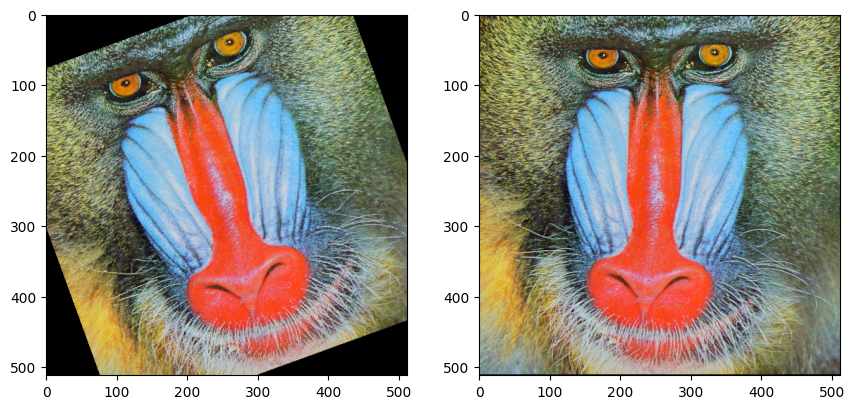

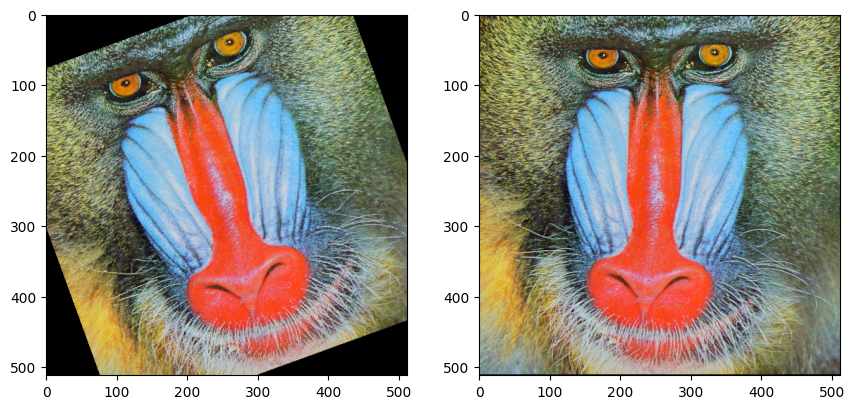

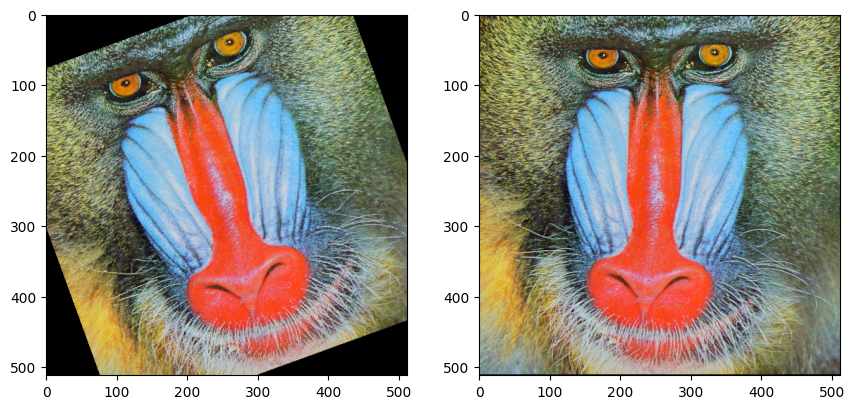

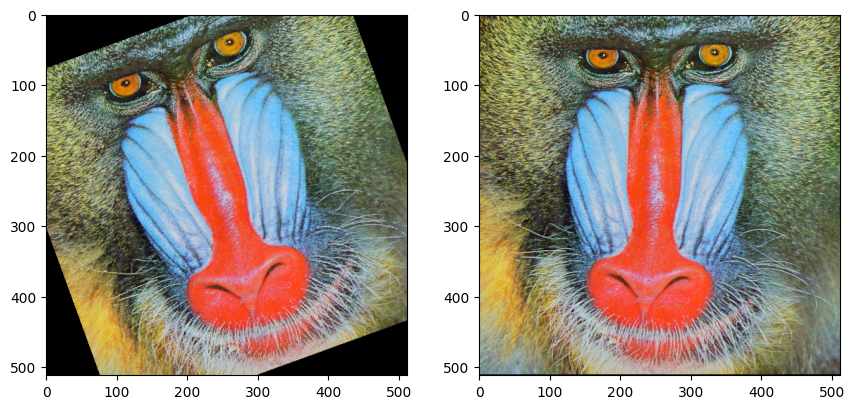

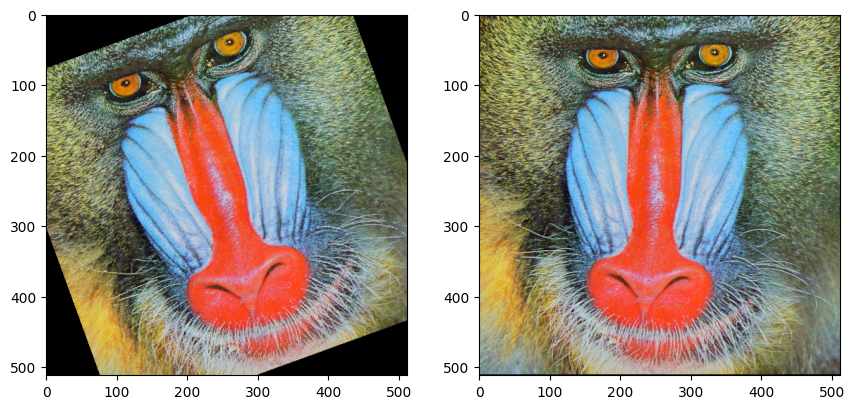

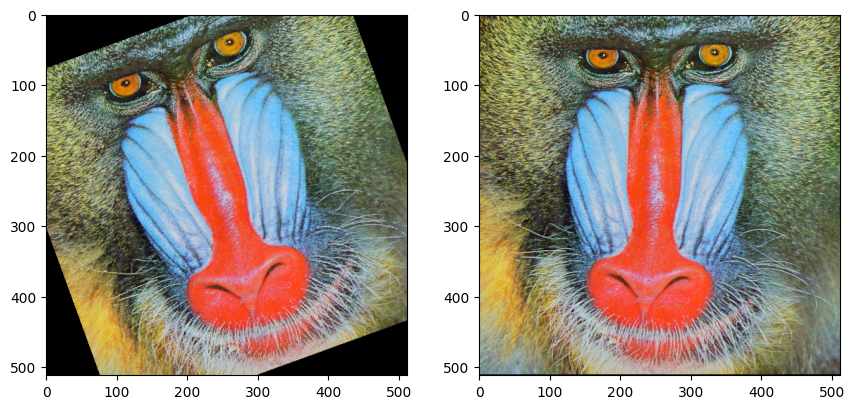

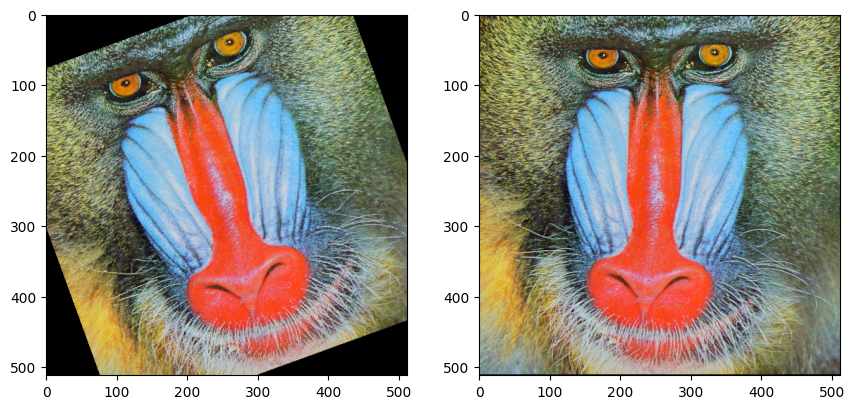

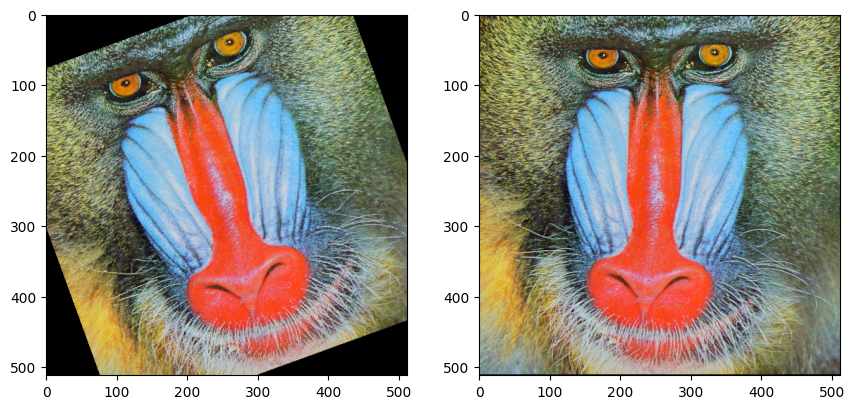

In [5]:


# Question 2a
def create_black(black):
    '''
    Creates an all black image array with same dimensions as image passed in
    '''
    

    for row in black:
        for col in row:
            col[0] = 0
            col[1] = 0
            col[2] = 0

    return black


def q_2a():
    '''
    Rotates mandrill.png by 20 degrees counter clockwise
    '''
    # read in image and create a black copy
    img = plt.imread('mandrill.png')
    black = img.copy()
    black = create_black(black)

    # n
    Y_MAX = len(img)

    # m 
    X_MAX = len(img[0])

    # loop through each pixel in black array 
    for j in range(Y_MAX):
        for i in range(X_MAX):
            #calculate corresponding pixel in the original image
            x = round(((i - (Y_MAX / 2)) * np.cos(np.deg2rad(-20))) + ((j - (X_MAX / 2)) * np.sin(np.deg2rad(-20))) + (Y_MAX / 2))
            y = round(-((i - (Y_MAX / 2)) * np.sin(np.deg2rad(-20))) + ((j - (X_MAX / 2)) * np.cos(np.deg2rad(-20))) + (X_MAX / 2))
    
            # if out of range then do not add pixel from original to the black array
            if (x not in range(X_MAX)) or (y not in range(Y_MAX)):
                continue
            #add image to black array
            black[j][i] = img[y][x]

    display_img(black, img)

%timeit q_2a()





1.86 s ± 29.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


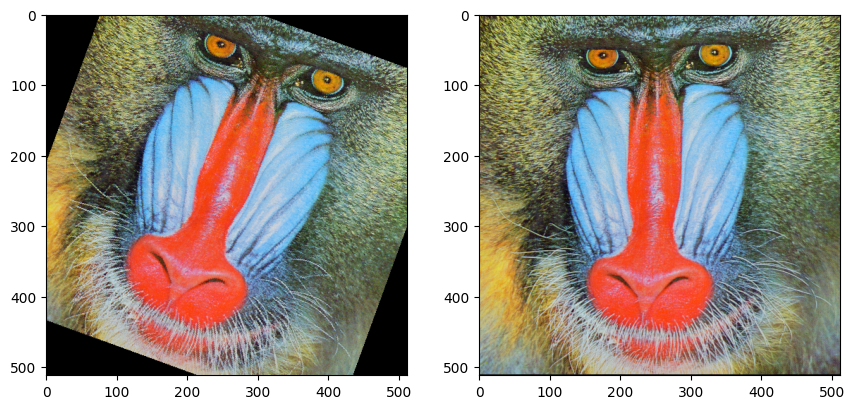

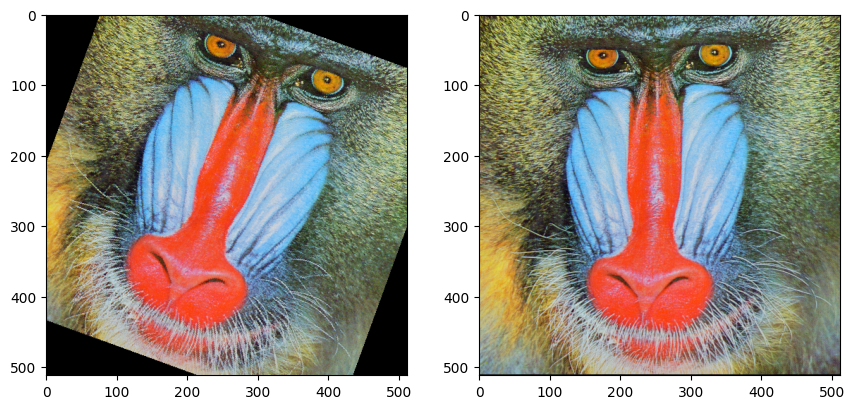

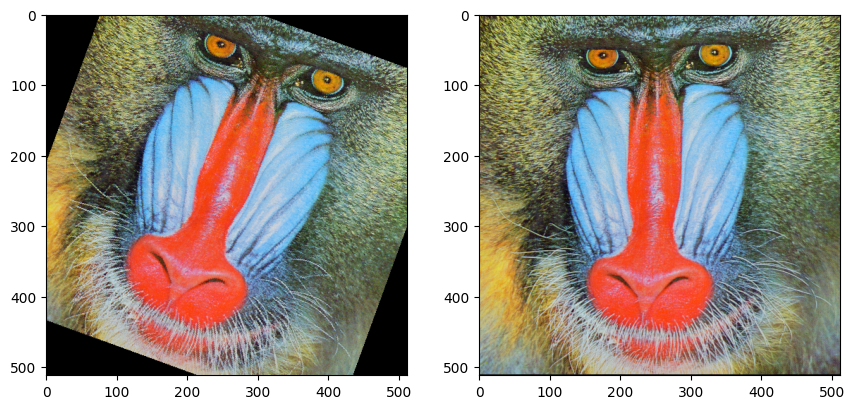

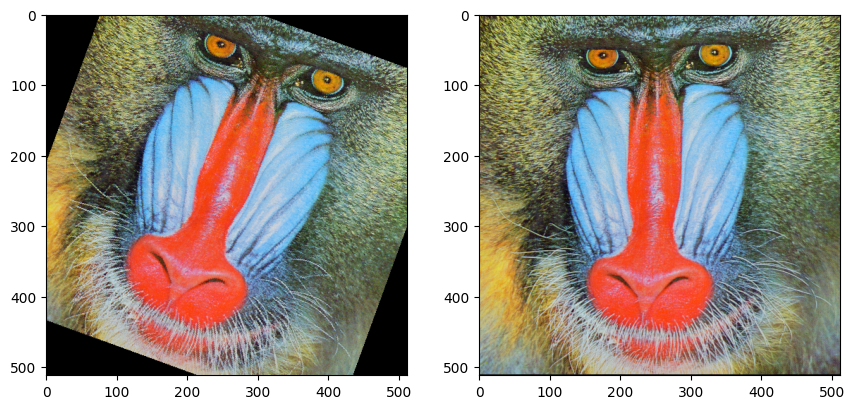

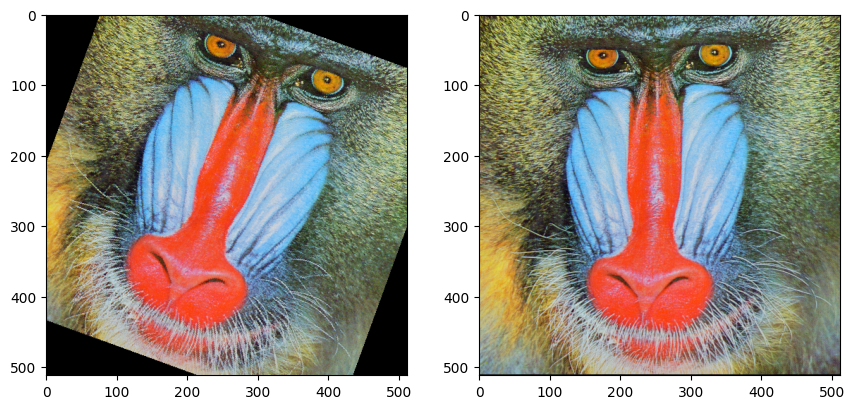

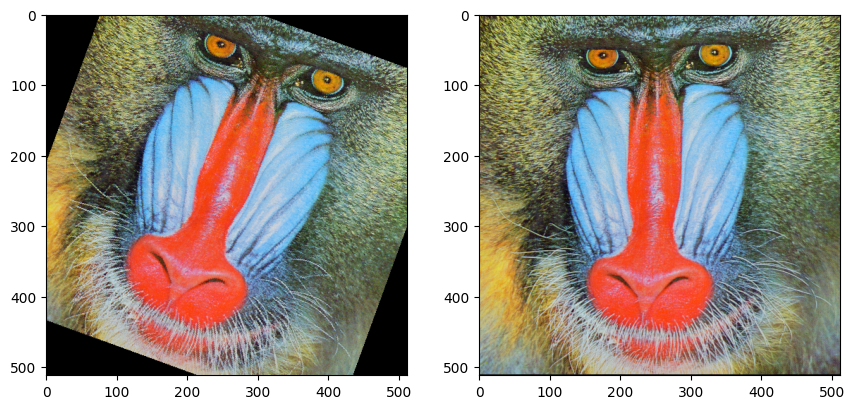

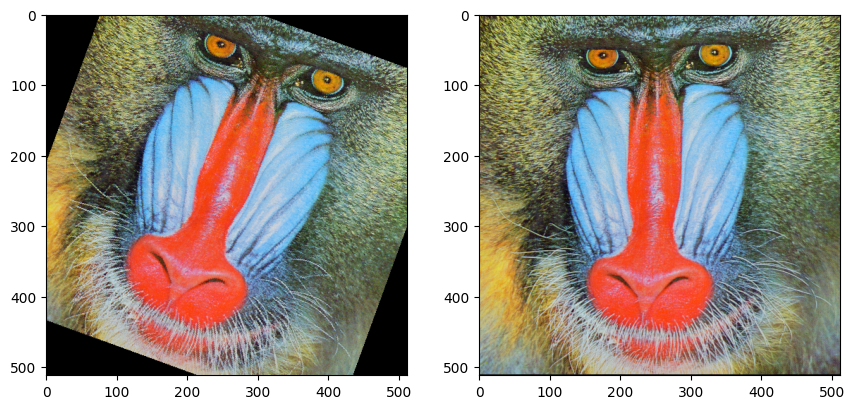

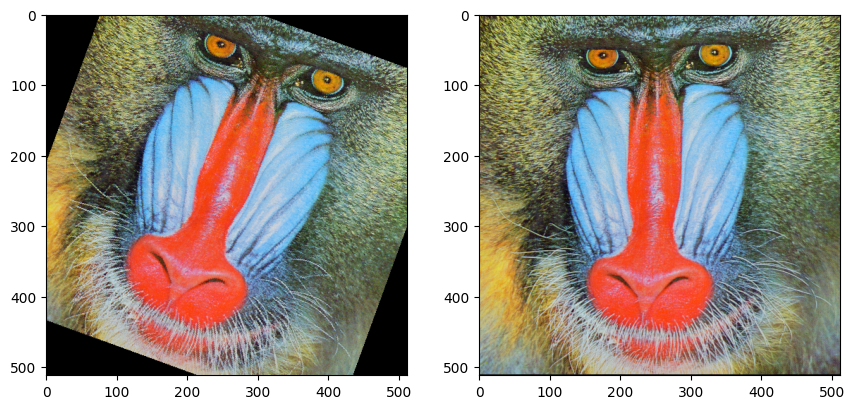

In [6]:
# Question 2b


def q_2b():
    '''
    Reads in mandrill.png and rotates it 20 degrees clockwise. Calculations are done outside of the loop when possible
    '''
    img = plt.imread('mandrill.png')
    black = img.copy()
    black = create_black(black)

    Y_MAX = len(img)
    X_MAX = len(img[0])

    # calculate coefficients
    COS = np.cos(np.deg2rad(20))
    SIN = np.sin(np.deg2rad(20))
    X = ((-Y_MAX / 2) * COS) - ((X_MAX / 2) * SIN) + (Y_MAX / 2)
    Y = ((Y_MAX / 2) * SIN) - ((X_MAX / 2) * COS) + (X_MAX / 2)

    # loop through image
    for j in range(Y_MAX):
        for i in range(X_MAX):
            # neccessary calculations
            x = round(X + (i * COS) + (j * SIN))
            y = round(Y - (i * SIN) + (j * COS))
    
            if (x not in range(X_MAX)) or (y not in range(Y_MAX)):
                continue
            black[j][i] = img[y][x]

    display_img(black, img)

%timeit q_2b()


 Taking out trig functions and things that can be pre calculated makes a very significant difference in performance. This is because this  algorithm is O(n^2) so anything inside the nested for loop is ran i * j times.

### Question 3

Image arrays can be usefully filtered by 2D centered FIR filters:

$$ y'_{i,j}=\sum_{m=-m_1}^{m_1}\sum_{n=-n_1}^{n_1}a_{m,n}y_{i,j}$$

These filters can perform many different functions including blurring, sharpening and edge detection. The coefficient array $a_{m,n}$ is known as the filter "kernel", and has size $2m_1+1$ by $2n_1+1$. Filter kernels are usually square, with $m_1=n_1$. This filtering operation is known as 2D convolution.

Edge detection is usually accomplished by smoothing (to remove image noise) and then applying a derivative operator. Further nonlinear operations can be used to refine the edges by suppressing weak edges, joining strong edges, etc. A commonly-used derivative kernel is the Sobel operator. For the horizontal (x) derivative, the Sobel operator is:

$$ S_x= \left[ \begin{array}{ccc}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1 \end{array} \right]  $$

and the vertical derivative uses the transpose $S_y=S_x^T$. These are simple extensions of the 1D 3-point stencil derivative operator from last week. The gradient magnitude of array $A$ is then $G=\sqrt{(S_x * A)^2+(S_y * A)^2}$ where the $*$ symbol denotes 2D convolution and the square root is taken on each element of the array individually.

Another commonly used filter kernel is the Laplacian ($\nabla^2$) kernel

$$ L = \left[ \begin{array}{ccc}
0 & -1 & 0 \\
-1 & 4 & -1 \\
0 & -1 & 0 \end{array} \right]  $$

which detects second derivatives. This is sometimes used in image sharpening filters, which take the form

$$ K = \left[ \begin{array}{ccc}
0 & 0 & 0 \\
0 & 1 & 0 \\
0 & 0 & 0 \end{array} \right] +\alpha L$$

where the degree of sharpening can be controlled by $\alpha$.

Start by writing a general function to apply an arbitrary filter (2D convolution) of the type described above, and then answer the following questions. Your function may discard the edge points where the filter cannot be applied ($m_1$ points from each of the 2 edges in the first dimension and $n_1$ from the 2 edges in the second dimension).

a. Load the mandrill image again, and perform a "boxcar smoothing" with a 15x15 kernel of the form $a_{m,n}=1/15^2$. Display the original and smoothed images.

b. Load the "peppers.png" image and apply a 5x5 boxcar smoothing. Find the gradient magnitude $G$ using the Sobel operator on each channel (R,G,B) and sum them to get an overall gradient. Apply a threshold of 30% of the maximum gradient to discard weak edges (that is, if the gradient is less than 30% of the max, set the RGB values to 0,0,0 and otherwise set R,G,B=1,1,1). Plot the original image and the processed edges.

c. Load the "eye.png" image and apply a Laplacian sharpening filter with kernel $K$ as given above and $\alpha=0.3$ (moderate sharpening) and then with $\alpha=3.0$ (extreme sharpening). This filter may cause some of the RGB values to go outside their nominal [0,1] range; they should be clipped to constrain the range. Plot the original image and the sharpened image for both values of $\alpha$.

d. Comment on the results.

[10 pts total]

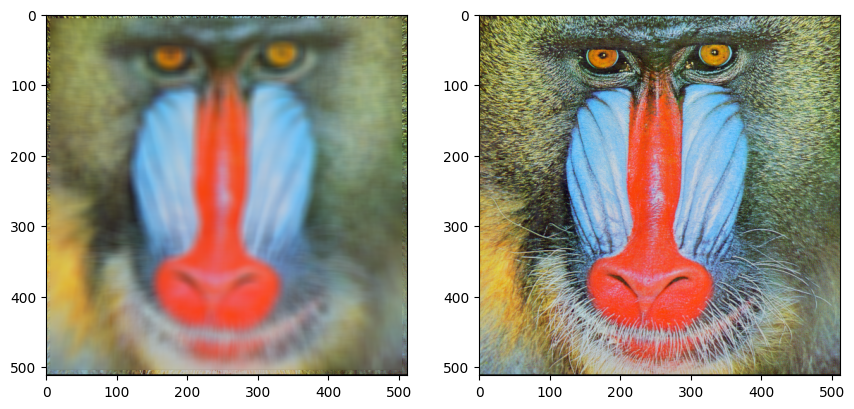

In [8]:
def convolve_2d(img,kernel, m, n, x, y):
    """
    General 2d convolution function. Uses N,M values to calculate a_mn
    """
    #calculate a_mn
    a_mn = ((2 * m) + 1) * ((2 * n) + 1)

    # create an empty array to add to
    RGBA = np.zeros(4)

    # loop through the kernel

    #y
    for i in range(len(kernel)):
        #x
        for j in range(len(kernel[0])):
            #z
            for k in range(len(kernel[0][0])):
                # add value to the corresponding RGBA value
                RGBA[k] += kernel[i][j][k]

    #divide RGBA values by coefficient
    RGBA = RGBA / a_mn

    #apply convolution to the orignal image
    for k in range(len(RGBA)):
        img[y][x][k] = RGBA[k]

        



def calc_kernel(img, m, n, x, y):
    '''
    Calculates the kernel for a boxcar filter of any size provided the image follows RGBA
    '''
    # kernel size 
    kernel = np.zeros(((2 * m) + 1, (2 * n) + 1, 4))
    #y
    for i in range(-m, m + 1):
        #x
        for j in range(-n, n + 1):
            #z
            for k in range(4):
                # assign values from img to kernel
                # order will go [0][0][1...4] to [0][1][1...4] etc
                kernel[i + m][j + n][k] = img[y + i][x + j][k]
            
    return kernel


# Load the image
img = plt.imread('mandrill.png')
convo = img.copy()


# find the 15x15 boxcar filter for mandrill.png
for y in range(6, 505):
    for x in range(6, 505):
        # n = 7 m = 7
        kernel = calc_kernel(img, 7, 7, x, y)
        convolve_2d(convo, kernel, 7, 7, x, y)

display_img(convo, img)



The 15x15 boxcar filter provides a very good blurring of the original mandrill image. The edges are still sharp because these edge values would have entries in the kernel that correspond to points not in the frame of the image. It is not obvious in this image but a 2d boxcar filter will tend to have an X pattern of more heavy blurring throughout the image. 

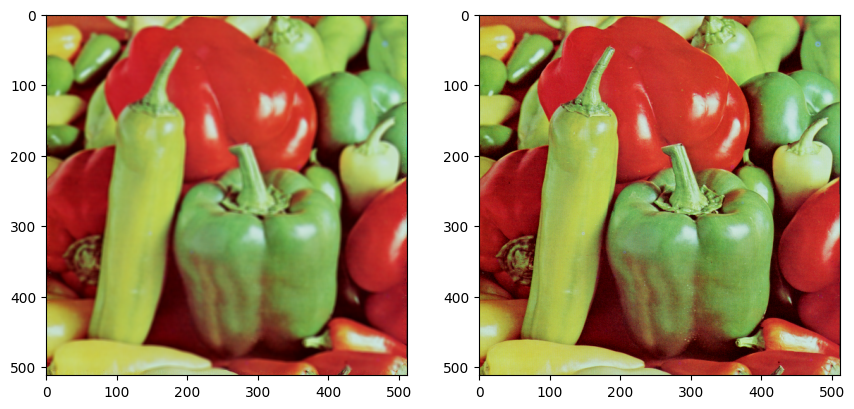

In [9]:
# Q3b
# Q3b is unfinished

# load in image and make a copy
img = plt.imread('peppers.png')
convo = img.copy()

# find the 5x5 boxcar
for y in range(6, 505):
    for x in range(6, 505):
        kernel = calc_kernel(img, 2, 2, x, y)
        convolve_2d(convo, kernel, 2, 2, x, y)
display_img(convo, img)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


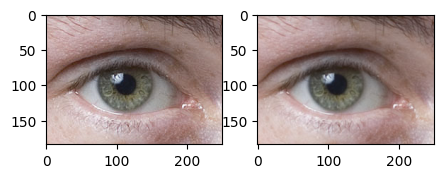

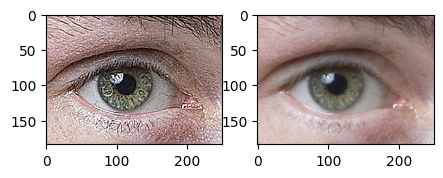

In [10]:
#Q3c

#read in image and create a copy
img = plt.imread('eye.png')
convo = img.copy()


def calculate_k(img, x, y):
    '''
    This function creates the part of the K kernel that is the zero matrix with a 1 in the center
    '''

    #create a zeroed array and disregard the A portion of RGBA
    K = np.zeros((3,3,3))

    for i in range(3):
        K[1][1][i] = img[y][x][i]

    return K


def calculate_L(img, x, y, n, m):
    '''
    This function calculates L portion of the K kernel (without the alpha scalar multiplier)
    '''

    # Laplacian kernel
    L = np.array([
    [[0, 0, 0], [-1, -1, -1], [0, 0, 0]],
    [[-1, -1, -1], [4, 4, 4], [-1, -1, -1]],
    [[0, 0, 0], [-1, -1, -1], [0, 0, 0]]
    ]) 

    
    newL = np.zeros((3,3,3))

    #y
    for i in range(-m, m + 1):
        #x
        for j in range(-n, n + 1):
            # RGB
            for k in range(3):
                # multiply the image values by the laplacian values and store in new Kernel
                newL[i + m][j + n][k] = (img[y + i][x + j][k]) * (L[i + m][j + n][k])

    return newL


def convolve_2d_Lap(img,kernel, m, n, x, y):
    """
    Completes the Edge sharpening process once the kernel has been calculated
    """
    # find a_mn coefficient
    a_mn = ((2 * m) + 1) * ((2 * n) + 1)
    # create a zeroed array disregarding the A in RGBA
    RGBA = np.zeros(3)

    #y
    for i in range(len(kernel)):
        #x
        for j in range(len(kernel[0])):
            # RGB
            for k in range(len(kernel[0][0])):
                #add values from kernel to RGB totals
                RGBA[k] += kernel[i][j][k]

    

    #loop through the values in RGBA and assign them to image
    #if the value is above 1 then clip it
    for k in range(3):
        var = RGBA[k]
        if var > 1:
            var = 1.0
        img[y][x][k] = var
        

# edge sharpening process for alpha = 0.3
for i in range(2,len(img) - 3):
    for j in range(2, len(img[0]) - 3):
        # find zero matrix with 1 in center for x = j y = i
        K = calculate_k(img, j, i)
        # find the Laplacian for x = j y = i
        L = calculate_L(img, j, i, 1, 1)
        #combine to find kernel
        K = K + (L * 0.3)
        #complete sharpening for x = j y = i
        convolve_2d_Lap(convo, K, 1, 1, j, i)


display_img(convo, img)
convo = img.copy()

# edge sharpening process for alpha = 3
for i in range(2,len(img) - 3):
    for j in range(2, len(img[0]) - 3):
        # find zero matrix with 1 in center for x = j y = i
        K = calculate_k(img, j, i)
        # find the Laplacian for x = j y = i
        L = calculate_L(img, j, i, 1, 1)
        #combine to find kernel
        K = K + (L * 3)
        #complete sharpening for x = j y = i
        convolve_2d_Lap(convo, K, 1, 1, j, i)

display_img(convo, img)   




Using an alpha value of 0.3 can make a noticeable difference but the 3.0 alpha clearly sharpens the image to a much larger extend. This is because the alpha value is essentially making the second derivative more prominent in the kernel.

### Conclusions

In question 1 we developed some basic understanding of how the RGBA data was stored and how to interact with it. 

In question 2 we rotated an image but the main take away was that there are ways to optimize you code that do not always involve super crazy and complicated development methods. Taking things out of loops will often improve performance especially when nested loops come in to play and algorithms begin to go above O(n) into O(n^2) or even O(n^3) territory. 

In question 3 the 15x15 convolution took a very long time simply because there was so much that had to be iterated over. Question 3c also showed how using different kernels such as a Laplacian kernal can make drastic changes on an image without adding any information into the system.

**Image sources:**

Mandrill.png and peppers.png are standard test images from the USC Signal and Image Processing Institute available at  https://sipi.usc.edu/database/database.php?volume=misc .

eyes.png is from the Wikipedia page for unsharp masking and is available at https://commons.wikimedia.org/wiki/File:Unsharped_eye.jpg. Image author is Ru_dragon, and the image is distributed under the GNU Free Documentation License.

